#### grid '.44'  comparesion object features: EUR-44/EUR-11 vs CERRA 

  - 1 Read griid file
  - 2 Read CERRA and Evaluaion Objs and interpolate to .44 grid
  - 3 Plottinge  

In [1]:
import os
import time 
import glob
import datetime
import pickle
import numpy as np
import xarray as xr
from tqdm import tqdm
from netCDF4 import Dataset
import pandas as pd
import seaborn as sns
 
import string
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cartopy 
import cartopy.crs as ccrs
from mpl_toolkits.basemap import Basemap

In [2]:
def plot_obj_eval(Lat, Lon, dataset, data_4d, characters):
    n_ds = len(dataset)
    n_char =  data_4d.shape[1]  
    
    level_s = [np.arange(6, 18, 1), np.arange(6, 8, 0.1), np.arange(6, 12, 0.5), np.arange(20, 300, 40)
             , np.arange(5000,50000,5000),np.arange(0,5,0.5) ,np.arange(0, 40, 4)]
    
    if n_ds == 4 :
        nrow = int(np.ceil(n_ds/2))
        ncol = 2
        x_fig = 12
        y_fig = 8
    else:
        nrow = int(np.ceil(n_ds/3))
        ncol = 3
        x_fig = 20
        y_fig = 10

    for nch in range(n_char):
        fig, ax = plt.subplots(nrow, ncol, subplot_kw={'projection': ccrs.PlateCarree()},figsize=(x_fig,y_fig))
        print(characters[nch])
        print('---------' )
        
        for ds in range(n_ds):
            nr = int(ds/ncol)
            nc = int((ds%ncol))
        
            DATAse = data_4d[ds, nch, :,:]
            
            if nrow != 1:
                #print(level_s[nch], nch )
                #If extend= 'neither', values outside the levels range are not colored
                im = ax[nr,nc].contourf(Lon, Lat, DATAse, levels=level_s[nch], cmap='RdYlBu_r', extend='both')
                
                fig.colorbar(im, ax=ax[nr,nc], shrink=0.9, location="bottom")
                ax[nr,nc].coastlines()
                ax[nr,nc].add_feature(cartopy.feature.BORDERS, linestyle='--') 
        
                ax[nr][nc].set_title(dataset[ds], wrap=True) # fontweight='bold')#, color= 'blue')
                xl = ax[nr][nc].gridlines(draw_labels=True)  
            else:
                im=ax[nc].contourf(Lon, Lat, DATAse, transform=ccrs.PlateCarree(), 
                               levels=level_s[obj], cmap='RdYlBu_r', extend='both')
                fig.colorbar(im, ax=ax[nr,nc], shrink=0.9)
                ax[nc].coastlines()
                ax[nc].add_feature(cartopy.feature.BORDERS, linestyle='--') 
        
                ax[nc].set_title(dataset[ds], wrap=True) # fontweight='bold')#, color= 'blue')
                xl = ax[nc].gridlines(draw_labels=True) 
                
            # remove empty extra plot
            if n_ds == 5:
                ax[1,2].set_axis_off()
                
        fig.suptitle(characters[nch], fontsize=20) 
        #plt.savefig('PDF/' + Objects[obj] + '_' + type_s + '_' + res + '.pdf')  
        plt.tight_layout()
        plt.show()   
        

In [11]:
def plot_obj_eval_diff(Lat, Lon, dataset, data_4d, characters):
    n_ds = len(dataset)
    n_char = data_4d.shape[1]  
    nrow = int(np.ceil(n_ds/3))
    ncol = 3
    
    level_s = range(-500,550,50) 
    
    if n_ds == 3:
        x_fig = 20
        y_fig = 5.5
    else:
        x_fig = 20
        y_fig = 10

    for nch in range(n_char):
        fig, ax = plt.subplots(nrow, ncol, subplot_kw={'projection': ccrs.PlateCarree()},figsize=(x_fig,y_fig))
        print(characters[nch])
        if characters[nch] == 'max':
            level_s = range(-16,18,2) 
        elif characters[nch] == 'min':
            level_s = range(-4, 5,1)
        elif characters[nch] == 'mean':
            level_s = range(-4,5,1)
        elif characters[nch] == 'tot':
            level_s = range(-260,280,20)
        elif characters[nch] == 'size':
            level_s = range(-30000,33000,3000)
        
        print('---------' )
        
        for ds in range(n_ds):
            nr = int(ds/ncol)
            nc = int((ds%ncol))
        
            DATAse = data_4d[ds, nch, :,:]
            
            if nrow != 1:
                #print(level_s[nch], nch )
                #If extend= 'neither', values outside the levels range are not colored
                im = ax[nr,nc].contourf(Lon, Lat, DATAse,  levels=level_s[nch], extend='both', \
                                        cmap='RdYlBu_r', transform=ccrs.PlateCarree())
                
                fig.colorbar(im, ax=ax[nr,nc], shrink=0.9, location="bottom")
                ax[nr,nc].coastlines()
                ax[nr,nc].add_feature(cartopy.feature.BORDERS, linestyle='--') 
        
                ax[nr][nc].set_title(dataset[ds], wrap=True) # fontweight='bold')#, color= 'blue')
                xl = ax[nr][nc].gridlines(draw_labels=True)  
            else:
                im=ax[nc].contourf(Lon, Lat, DATAse, transform=ccrs.PlateCarree(), \
                                   levels=level_s, cmap='RdYlBu_r', extend='both')
                fig.colorbar(im, ax=ax[nc], shrink=0.9, location="bottom")
                ax[nc].coastlines()
                ax[nc].add_feature(cartopy.feature.BORDERS, linestyle='--') 
        
                ax[nc].set_title(dataset[ds] + '-CERRA', wrap=True) # fontweight='bold')#, color= 'blue')
                xl = ax[nc].gridlines(draw_labels=True) 
                
            # remove empty extra plot
            if n_ds == 5:
                ax[1,2].set_axis_off()

        fig.suptitle(characters[nch], fontsize=30) 
        #plt.savefig('PDF/' + Objects[obj] + '_' + type_s + '_' + res + '.pdf')  
        plt.tight_layout()
        plt.show()   
        

In [12]:

# searchsort is faster than nanargmin proach
def find_index(lat_1d, lon_1d, ptx_1d, pty_1d):
    x_1d=np.searchsorted(lat_1d, ptx_1d)
    y_1d=np.searchsorted(lon_1d, pty_1d)
    return x_1d, y_1d

# Average duplicate values from paired list
def group(key, value):
    """
    group the values by key
    returns the unique keys, their corresponding per-key sum, and the keycounts
    """
    # upcast to numpy arrays
    key = np.asarray(key)
    value = np.asarray(value)
    
    # sort by key
    I = np.argsort(key)
    key = key[I]
    value = value[I]
    
    # index/the slicing points of the bins to sum over
    unique_keys, slices = np.unique(key, return_index=True)
   
    # sum over the slices specified by index
    per_key_sum = np.add.reduceat(value, slices)
    
    # number of counts per key is the difference of our slice points. cap off with number of keys for last bin
    key_count = np.diff(np.append(slices, len(key)))

    return unique_keys, per_key_sum, key_count

# end of group

#### calculate/interpolte obj_charactor
def wt_charactor_2d(lat_1d, lon_1d, flnm_list, flnm_o):
    characters = ['max', 'min', 'mean', 'tot', 'size']
    n_char = len(characters)

    lat_arr = np.array([])
    lon_arr = np.array([])
    max_arr = np.array([])
    min_arr = np.array([])
    avg_arr = np.array([])
    tot_arr = np.array([])
    size_arr = np.array([])

    start = time.time()
    print('start')
    
    
    for flnm in file_list:
        print(flnm)
        data = np.load(flnm, allow_pickle=True)
        n_obj = len(data)
     
        for no in range(n_obj):
            lat_arr  = np.append(lat_arr, np.array(data[list(data.keys())[no]]['track'][:,0]))
            lon_arr  = np.append(lon_arr, np.array(data[list(data.keys())[no]]['track'][:,1]))
            max_arr  = np.append(max_arr, np.array(data[list(data.keys())[no]]['max']))    
            min_arr  = np.append(min_arr, np.array(data[list(data.keys())[no]]['min']))
            avg_arr  = np.append(avg_arr, np.array(data[list(data.keys())[no]]['mean']))
            tot_arr  = np.append(tot_arr, np.array(data[list(data.keys())[no]]['tot']))
            size_arr = np.append(size_arr, np.array(data[list(data.keys())[no]]['size'])) 

    n_total = len(lat_arr)
    print('total obj', n_total)

    data_2d = np.zeros((n_char, n_total))
    data_2d[0,:] = max_arr
    data_2d[1,:] = min_arr
    data_2d[2,:] = avg_arr
    data_2d[3,:] = tot_arr
    # area m2->km2
    data_2d[4,:] = size_arr*0.000001

    n_lon = len(lon_1d)
    n_lat = len(lat_1d)
    data_3d = np.zeros((n_char, n_lat, n_lon))

    # get the (i,j) of objs and makes it the key
    ind_2 = find_index(lat_1d, lon_1d, lat_arr, lon_arr)
    key_1d = np.array([x*10000 + y  for (x, y) in zip(ind_2[0], ind_2[1])])
    
    # get the unique objs
    for nc in range(n_char):
        unique_keys, per_key_sum, key_count = group(key_1d, data_2d[nc,:])
   
        if nc==0:
            print('unique', len(unique_keys))
            i_lat = (unique_keys/10000).astype(int)
            i_lon = (unique_keys - i_lat*10000).astype(int)
            i_lat = np.where(i_lat<n_lat, i_lat, n_lat-1)
            i_lon = np.where(i_lon<n_lon, i_lon, n_lon-1)
    
        # get average
        per_key_avg = np.array(per_key_sum/key_count)
        
        for nn in range(len(unique_keys)):
            data_3d[nc, i_lat[nn], i_lon[nn]] = per_key_avg[nn]    

    ### create and write out dataset
    da = xr.DataArray(data = data_3d,
                coords={'var':range(n_char), 'lat':lat_1d, 'lon':lon_1d}, 
                dims=['var', 'lat', 'lon'])

 
    # create and write out dataset 
    ds = da.to_dataset(name = 'obj_characters') 
    ds['obj_characters'].attrs = {'_FillValue': 0}
    ds.attrs = {'object_characters': characters}
    ds.to_netcdf(flnm_o)
    print('output file:', flnm_o)             
        
    end = time.time()
    print(f'Reading Pickle took: {end - start} seconds')

#### 0 setup

In [13]:
proj = ccrs.PlateCarree()
type_s = ['evaluation']

#### 1) Target grid .44 

In [14]:
# OLD dir_cerra = '/glade/campaign/mmm/c3we/mingge/FRONTIERS/data/ProcessIdentification/CORDEX/TarGrid.44/EUR-44/CERRA/'
# dir_eval = '/glade/campaign/mmm/c3we/mingge/FRONTIERS/data/ProcessIdentification/CORDEX/TarGrid.44/EUR-44/evaluation/ECMWF-ERAINT/r1i1p1/'

dir_d = '/glade/campaign/mmm/c3we/mingge/FRONTIERS/OBJS/Regular_0.44/'
dir_cerra = dir_d + 'CERRA/'
 
# OLD dir_o = '/glade/campaign/mmm/c3we/mingge/FRONTIERS/'
dir_o = '/glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/'

# for CERRA
year_s = 1990
year_e = 2010
n_year = year_e - year_s + 1

flnm = dir_cerra + '201001_CERRA_ObjectMasks__dt-3h_MOAAP-masks.nc'

ncid = Dataset(flnm)
Lat=np.squeeze(ncid.variables['lat'][:])
Lon=np.squeeze(ncid.variables['lon'][:])
nx = Lon.shape[0]
ny = Lon.shape[1]
ncid.close()
print('grid is from ', flnm, nx, ny)

# Create .5  meshgrid 
lat_min = int(Lat.min()) + .5
lat_max = int(Lat.max())
lon_min = int(Lon.min()) + .5
lon_max = int(Lon.max())

dx = .5
lat_1d = np.arange(lat_min, lat_max+1, dx)
lon_1d = np.arange(lon_min, lon_max+1, dx) 
lon_grid, lat_grid = np.meshgrid(lon_1d,lat_1d)

n_lon = len(lon_1d)
n_lat = len(lat_1d)
print('lat-lon:', n_lat, n_lon, lat_grid.shape, lon_grid.shape)

grid is from  /glade/campaign/mmm/c3we/mingge/FRONTIERS/OBJS/Regular_0.44/CERRA/201001_CERRA_ObjectMasks__dt-3h_MOAAP-masks.nc 92 187
lat-lon: 81 163 (81, 163) (81, 163)


In [15]:
characters = ['mass_center_loc', 'speed', 'tot', 'min', 'max', 'mean', 'size', 'track','times']
characters = ['max', 'min', 'mean', 'tot','size']
n_char = len(characters)

#### 2) Read in character files and interpolated to target grid 

- 2.1) read and interpolate CERRA PR objs

In [16]:
flnm_o = dir_o + 'obj_character_cerra_44.nc'

if os.path.isfile(flnm_o) == True:
    print(flnm_o, 'exist')
    with  xr.open_dataset(flnm_o) as ds:
        # obj_characters(var, lat, lon) 
        da = ds['obj_characters']
else:
    # Make file lists using a wildcard
    #file_list = np.sort(glob.glob(dir_cerra +'PR_*IVTt-9'))
    file_list = []
    for year in range(year_s, year_e + 1):
        file_list.append(dir_cerra +'PR_CERRA_' + str(year) + '01_dt-3h_MOAAP-masks.pkl')

    wt_charactor_2d(lat_1d, lon_1d, file_list, flnm_o)

/glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_cerra_44.nc exist


- 2.2) read and interpolate Evaluations 

---- /glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_CLMcom-CCLM5-0-6_v1_EUR-44.nc
/glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_CLMcom-CCLM5-0-6_v1_EUR-44.nc exist
---- /glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_MOHC-HadGEM3-RA_v1_EUR-44.nc
/glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_MOHC-HadGEM3-RA_v1_EUR-44.nc exist
---- /glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_UCAN-WRF331G_v01_EUR-44.nc
/glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_UCAN-WRF331G_v01_EUR-44.nc exist
(4, 5, 81, 163)
/glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_CLMcom-CCLM5-0-6_v1_EUR-44.nc
/glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_MOHC-HadGEM3-RA_v1_EUR-44.nc
/glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_UCAN-WRF331G_v01_EUR-44.nc
/glade/campaign/mmm/c3we/mingge/FRON

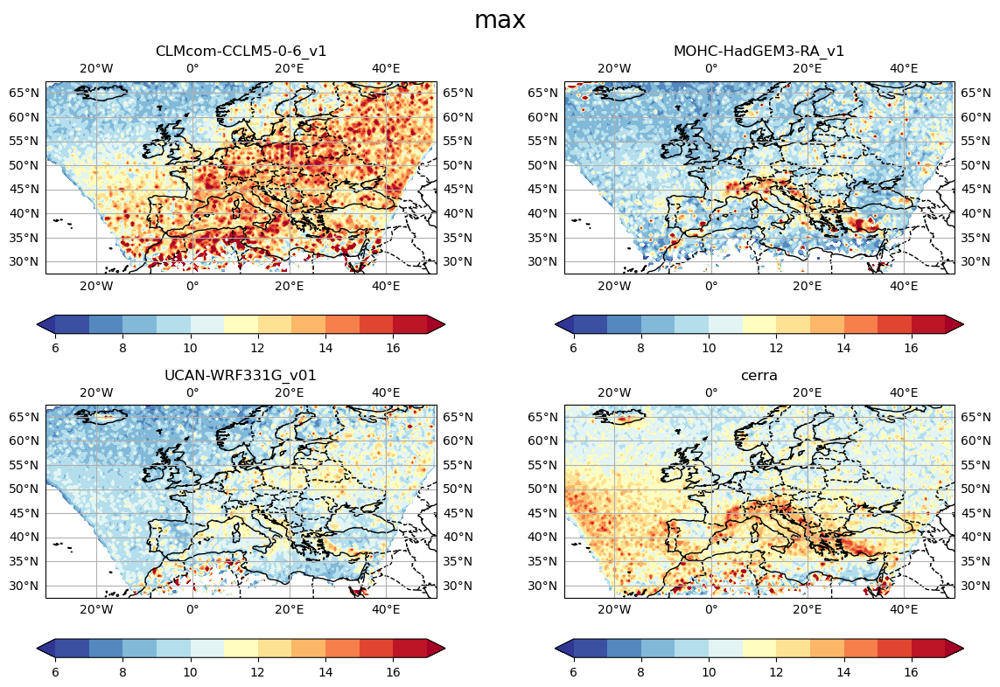

min
---------


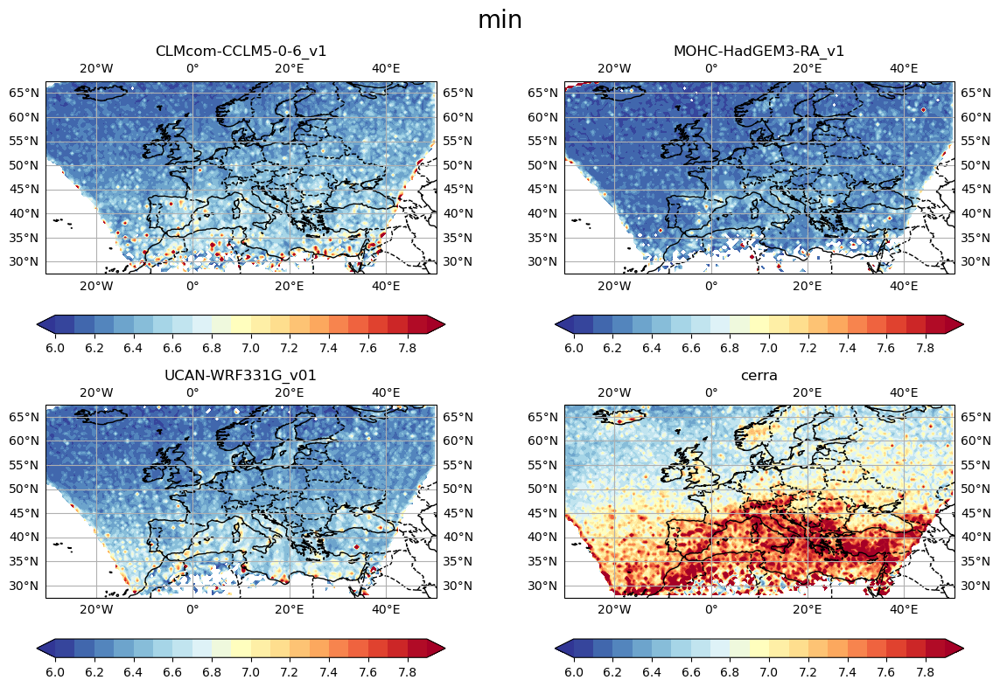

mean
---------


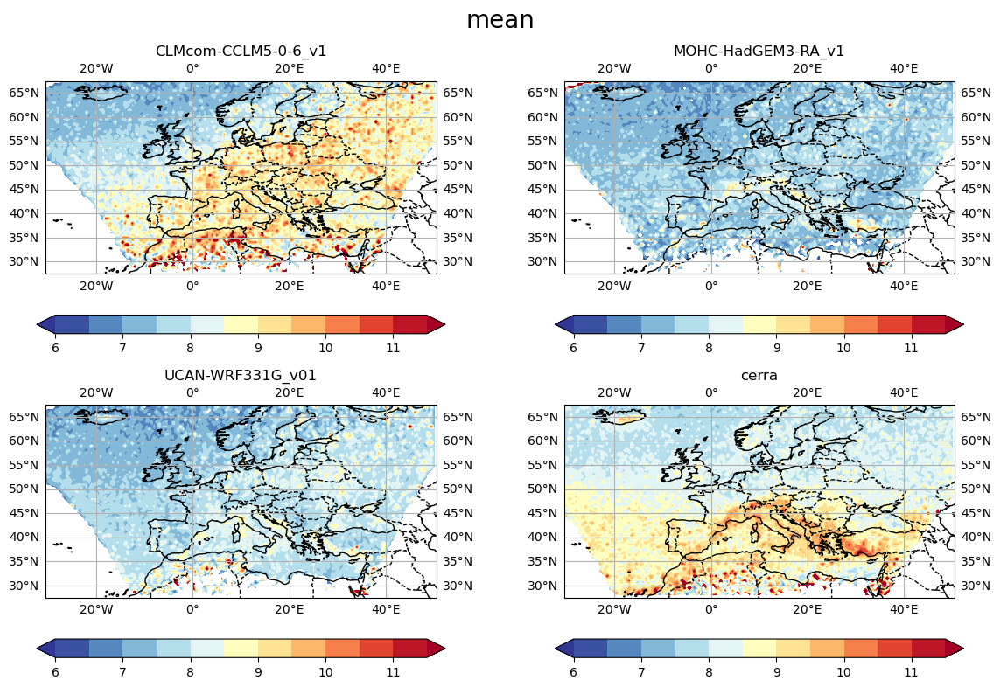

tot
---------


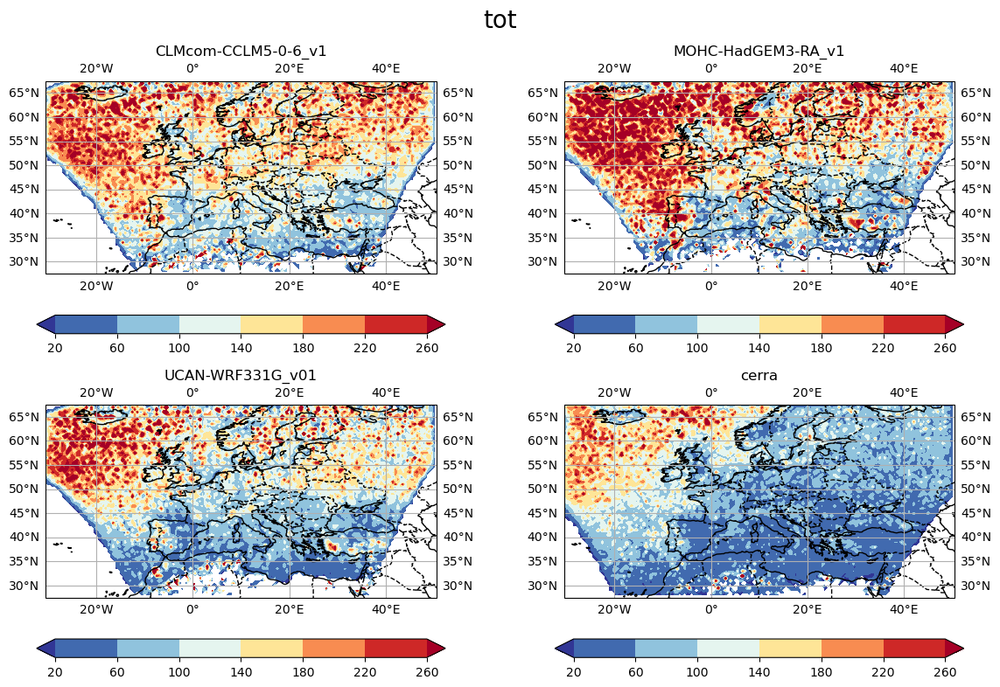

size
---------


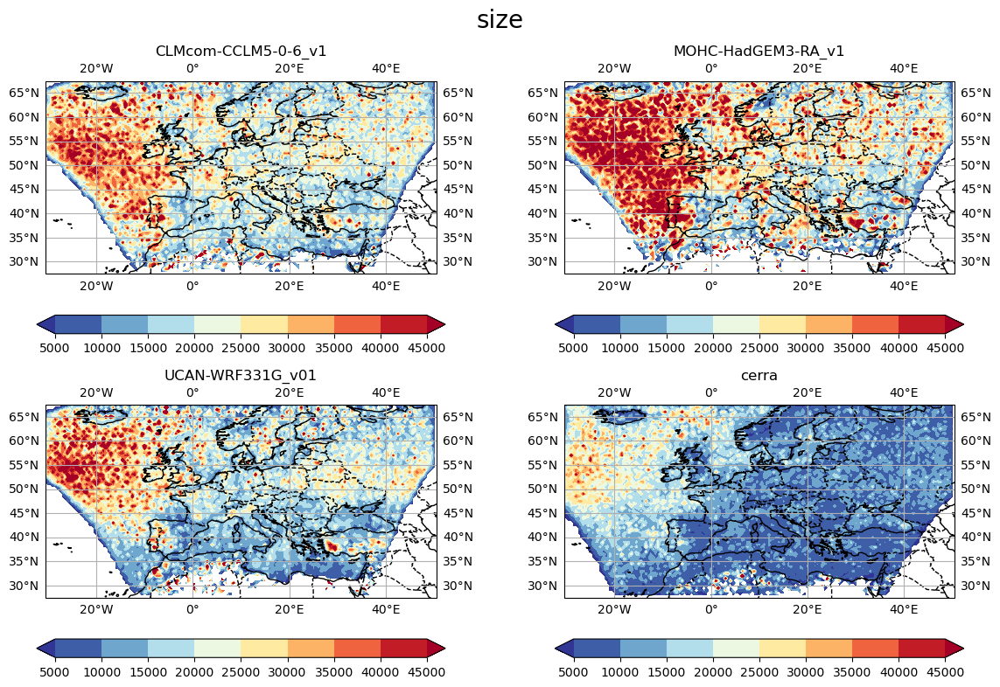

max
---------


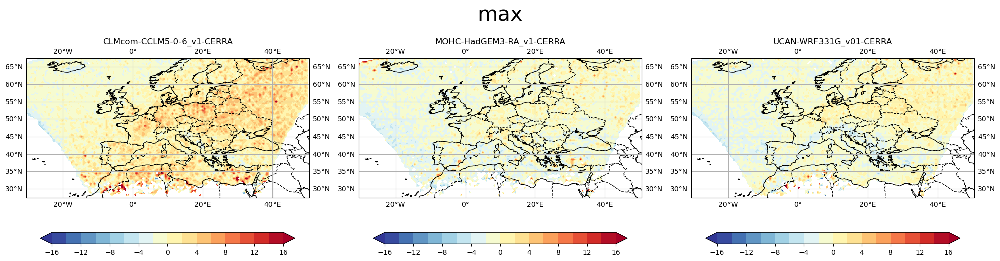

min
---------


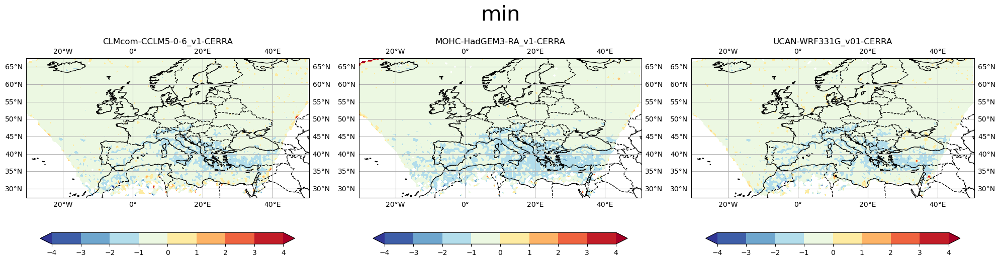

mean
---------


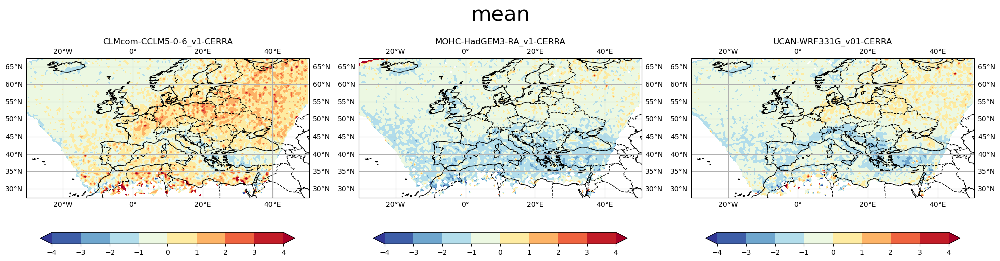

tot
---------


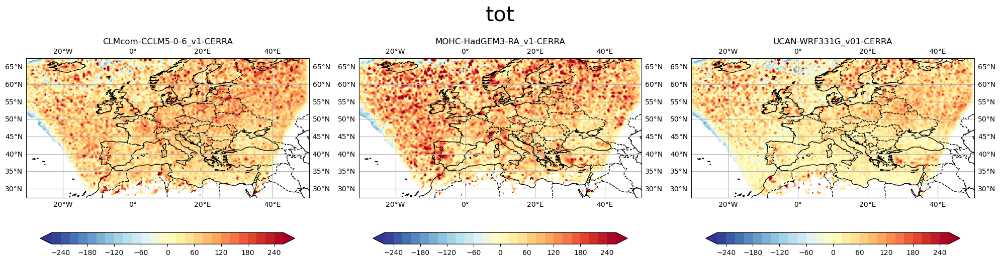

size
---------


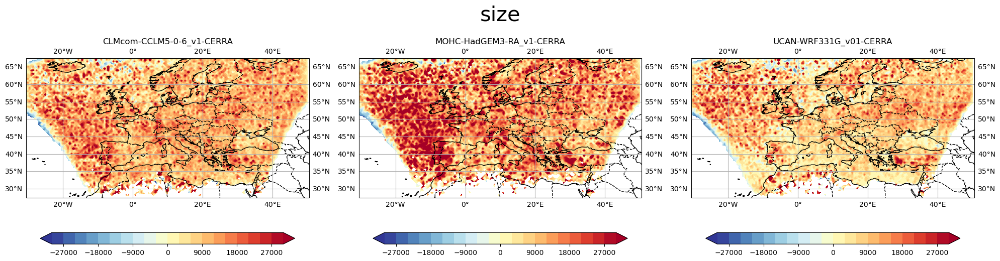

---- /glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_CLMcom-ETH-COSMO-crCLIM-v1-1_v1_EUR-11.nc
/glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_CLMcom-ETH-COSMO-crCLIM-v1-1_v1_EUR-11.nc exist
---- /glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_MOHC-HadREM3-GA7-05_v1_EUR-11.nc
/glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_MOHC-HadREM3-GA7-05_v1_EUR-11.nc exist
---- /glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_ICTP-RegCM4-6_v1_EUR-11.nc
/glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_ICTP-RegCM4-6_v1_EUR-11.nc exist
(4, 5, 81, 163)
/glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_CLMcom-ETH-COSMO-crCLIM-v1-1_v1_EUR-11.nc
/glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_MOHC-HadREM3-GA7-05_v1_EUR-11.nc
/glade/campaign/mmm/c3we/mingge/FRONTIERS/PAPER/obj_character_evaluation_ICTP-RegCM4-6_v

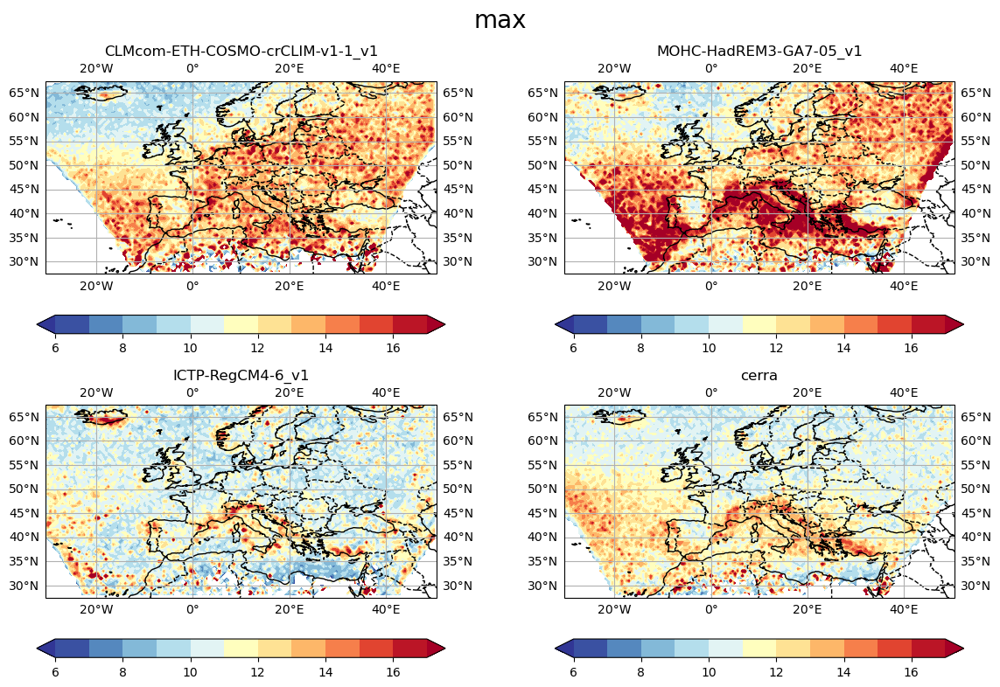

min
---------


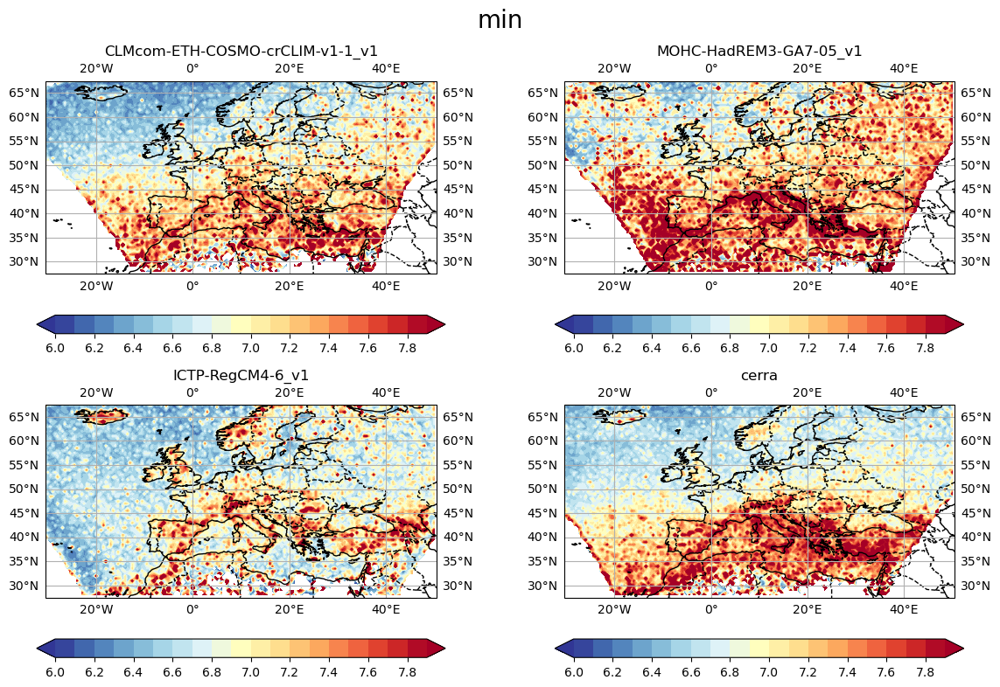

mean
---------


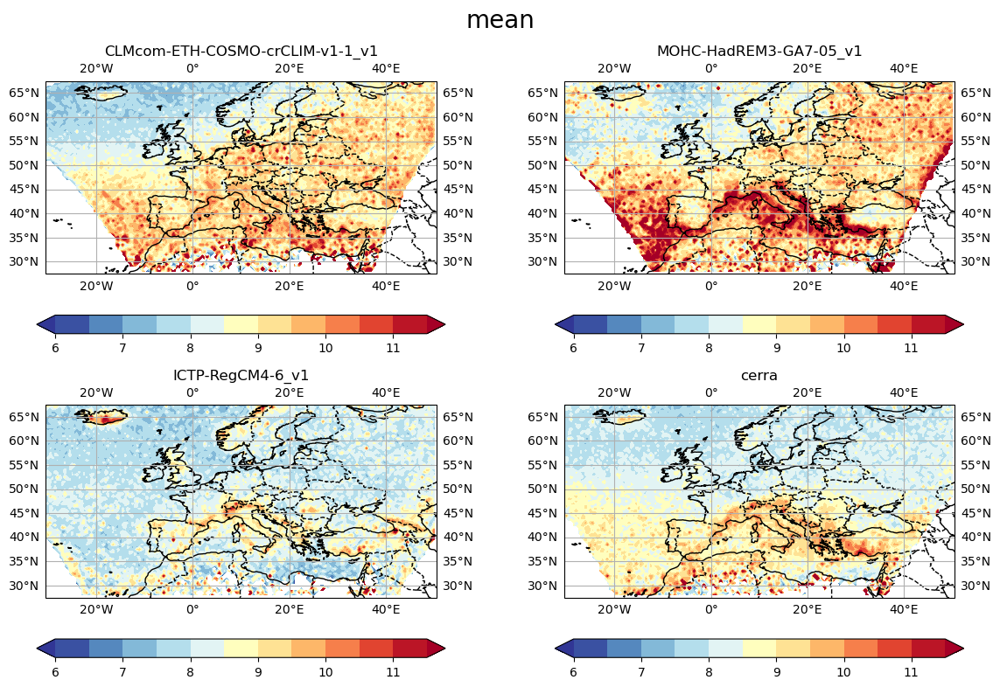

tot
---------


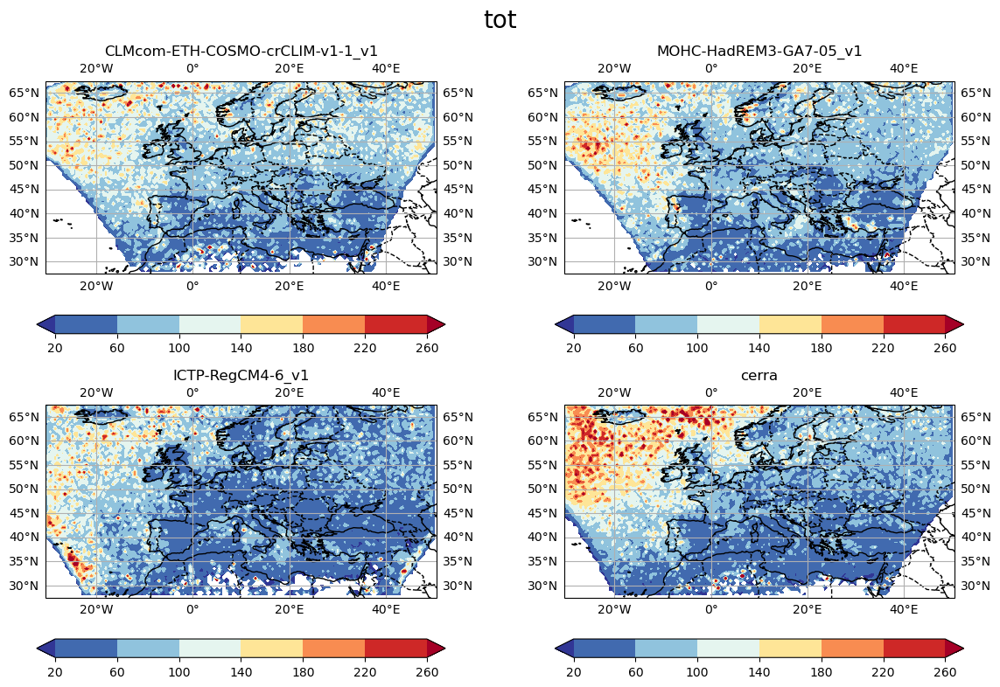

size
---------


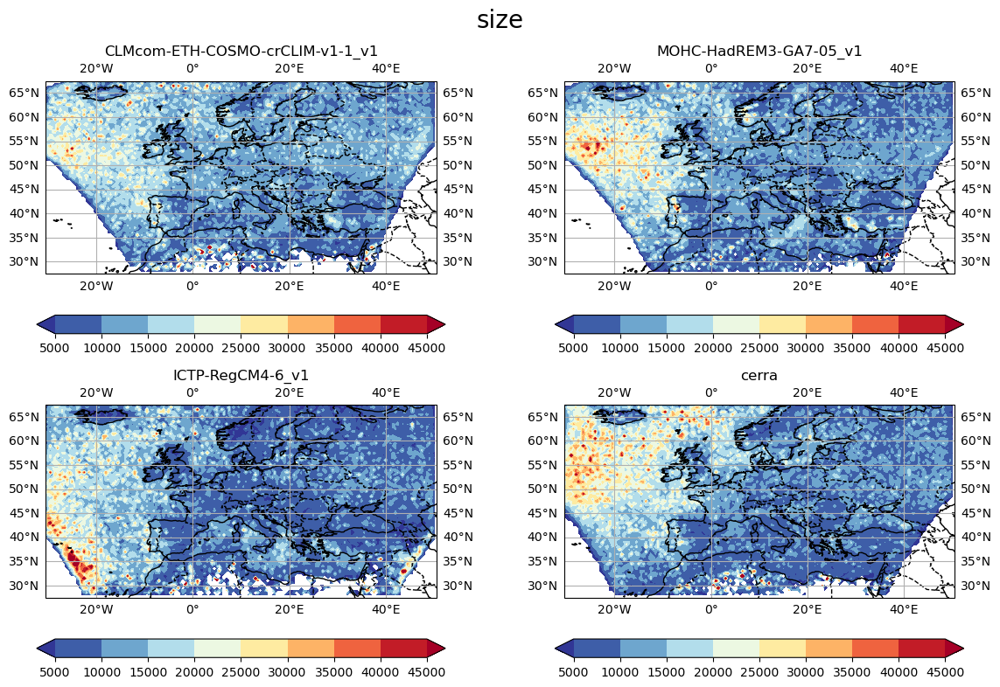

max
---------


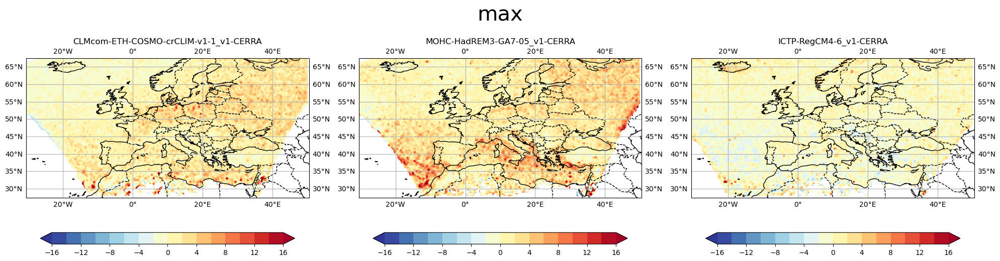

min
---------


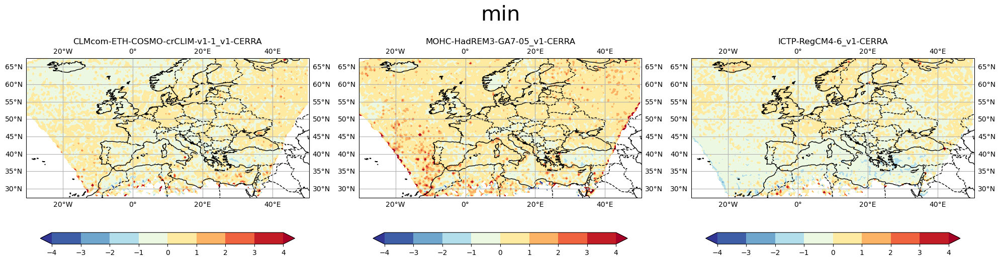

mean
---------


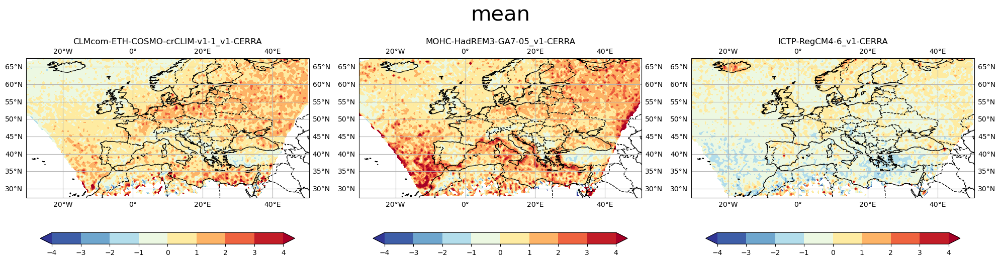

tot
---------


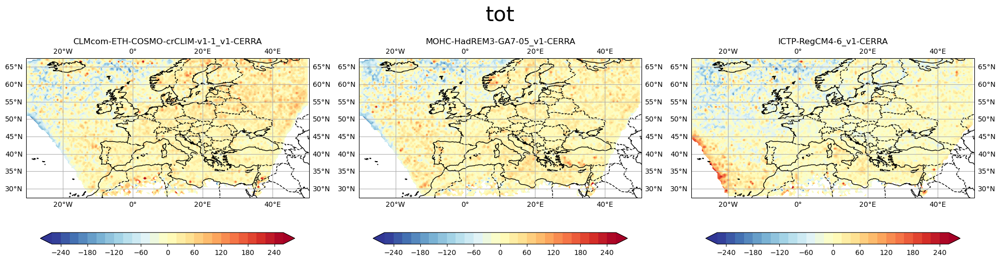

size
---------


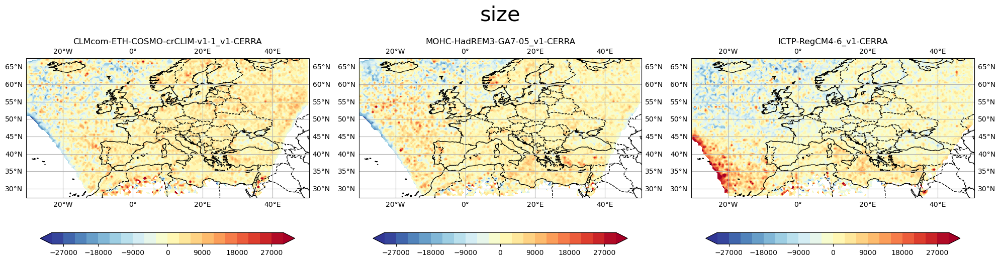

In [17]:

EUR_1d = ['EUR-44', 'EUR-11']
n_eur = len(EUR_1d)
lon_2d, lat_2d = np.meshgrid(lon_1d, lat_1d) 

for res_EUR in EUR_1d:
    dir_eval = dir_d + res_EUR + '/'
    if res_EUR == 'EUR-44':
        model_s = ['CLMcom-CCLM5-0-6_v1', 'MOHC-HadGEM3-RA_v1', 'UCAN-WRF331G_v01']
    elif res_EUR == 'EUR-11':
        model_s = ['CLMcom-ETH-COSMO-crCLIM-v1-1_v1', \
                'MOHC-HadREM3-GA7-05_v1',\
                'ICTP-RegCM4-6_v1']

    n_model = len(model_s)
 
    for nm in range(n_model):
        flnm_o = dir_o + 'obj_character_evaluation_' + model_s[nm] + '_' + res_EUR + '.nc'
        print('----', flnm_o)
        if os.path.isfile(flnm_o) == True:
            print(flnm_o, 'exist')
            with  xr.open_dataset(flnm_o) as ds:
                da = ds['obj_characters']
        else:
            # Make file lists from current directory using a wildcard
            file_list = np.sort(glob.glob(dir_eval + model_s[nm] + '/PR_*'+model_s[nm]+'*.pkl'))
            #print(file_list)
            wt_charactor_2d(lat_1d, lon_1d, file_list, flnm_o)

    # plotting
    dataset = model_s + ['cerra']
    n_ds = len(dataset)

    data_4d = np.zeros((n_ds, n_char, n_lat, n_lon))
    print(data_4d.shape)

    for nd in range(n_ds):
        if dataset[nd] == 'cerra':
            flnm = dir_o + 'obj_character_cerra_44.nc'
        else:
            flnm = dir_o + 'obj_character_evaluation_' + dataset[nd] + '_'+res_EUR+'.nc'
        print(flnm)
        with  xr.open_dataset(flnm) as ds:
            data_4d[nd] = ds['obj_characters'].values   

    plot_obj_eval(lat_2d, lon_2d, dataset, data_4d, characters)   

    # plotting difference
    data_4d_new = data_4d[:-1].copy()

    for nd in range(len(dataset)-1):
        data_4d_new[nd,:,:,:] = data_4d[nd,:,:,:] - data_4d[-1]
                                   
    plot_obj_eval_diff(lat_2d, lon_2d, dataset[:-1], data_4d_new, characters)

- 4) Some obj. statistics from 1990 - 2010
 - 4.1) annual number of obj in .44 domain 

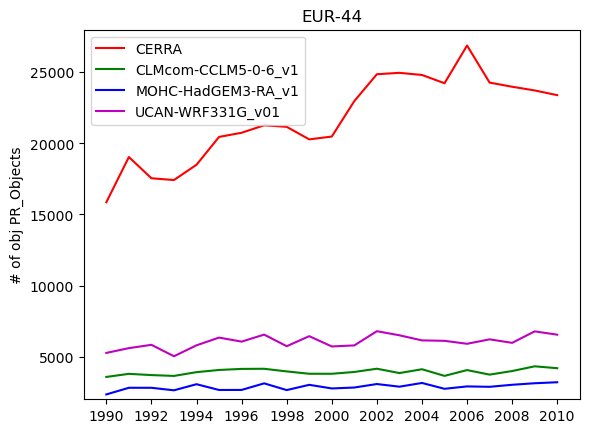

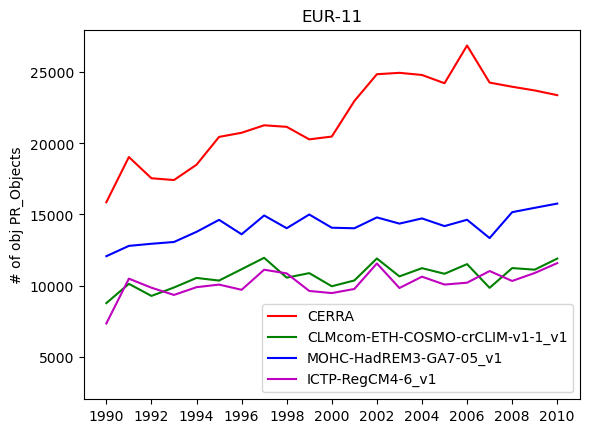

CPU times: user 1min 21s, sys: 9.22 s, total: 1min 30s
Wall time: 1min 58s


In [23]:
%%time
# this will take 5-6 min 
var_1d = ['PR_Objects']
n_v = len(var_1d)

year_s = 1990
year_e = 2010
n_year = year_e - year_s + 1

EUR_1d = ['EUR-44', 'EUR-11']
n_eur = len(EUR_1d)

color_1d = ['r','g', 'b', 'm']
for res_EUR in EUR_1d:
    dir_eval = dir_d + res_EUR + '/'
    if res_EUR == 'EUR-44':
        model_s = ['CLMcom-CCLM5-0-6_v1', 'MOHC-HadGEM3-RA_v1', 'UCAN-WRF331G_v01']
    elif res_EUR == 'EUR-11':
        model_s = ['CLMcom-ETH-COSMO-crCLIM-v1-1_v1', \
                'MOHC-HadREM3-GA7-05_v1',\
                'ICTP-RegCM4-6_v1']

    model_1d = ['CERRA'] + model_s 
    n_model = len(model_1d)
     
    nobj_3d = np.zeros((n_model, n_year, n_v))
 
    for year in range(year_s, year_e + 1):
        flnm = dir_cerra + str(year) + '01_CERRA_ObjectMasks__dt-3h_MOAAP-masks.nc'
        ncid = Dataset(flnm)
        #print(flnm)
        for nv in range(n_v): 
            nobj_3d[0, year-year_s, nv] = (ncid.variables[var_1d[nv]])[:].max() 

    # read EUR data    
    for year in range(year_s, year_e + 1):
        for nm  in range(1, n_model):
            flnm = dir_eval + model_1d[nm] +'/'+str(year) + '01_'+ model_1d[nm] +'_ObjectMasks__dt-3h_MOAAP-masks.nc'
            ncid = Dataset(flnm)
            #print(flnm)
            for nv in range(n_v): 
                nobj_3d[nm, year-year_s, nv] = (ncid.variables[var_1d[nv]])[:].max() 

    # plotting
    for nv in range(n_v): 
        for nm in range(n_model):
            plt.plot(range(year_s, year_e+1), nobj_3d[nm, :, nv], color_1d[nm])
            plt.title(res_EUR)
            plt.ylim(2000, 28000)
            plt.xticks(range(year_s, year_e+1, 2))
            plt.ylabel('# of obj ' + var_1d[nv])
        plt.legend(model_1d)
        plt.show()